In [1]:
from mne import read_epochs, set_eeg_reference, concatenate_epochs
from mne.decoding import CSP, UnsupervisedSpatialFilter
from mne.preprocessing import ICA, EOGRegression
import numpy as np
from mne.viz import plot_ica_components
from jupyterthemes.stylefx import set_nb_theme
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
set_nb_theme('gruvboxd')

Load and Preprocessing

In [7]:
import sys
sys.path.append('../../preprocessing')
from load_data import load_raw_to_epochs, get_channel_types

# load_raw_to_epochs('s1.bdf', True)

In [9]:
raw0 = read_epochs('raw0_epo.fif')
raw1 = read_epochs('raw1_epo.fif')

raw = concatenate_epochs([raw0, raw1])
raw.save('raw_epo.fif', overwrite=True)

Reading C:\Users\Alberto\Documents\BCI\data\grg\raw0_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
Reading C:\Users\Alberto\Documents\BCI\data\grg\raw1_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
81 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
133 matching events found
No baseline correction applied
Overwriting existing file.


In [8]:
raw = read_epochs('raw_epo.fif')

Reading C:\Users\Alberto\Documents\BCI\data\grg\raw_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
133 matching events found
No baseline correction applied
0 projection items activated


Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  11 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 528 tasks      | elapsed:    2.2s
[Parallel(n_jobs=8)]: Done 3008 tasks      | elapsed:    8.4s
[Parallel(n_jobs=8)]: Done 9371 tasks      | elapsed:   15.1s
[Parallel(n_jobs=8)]: Done 9576 out of 9576 | elapsed:   15.3s finished


Using matplotlib as 2D backend.


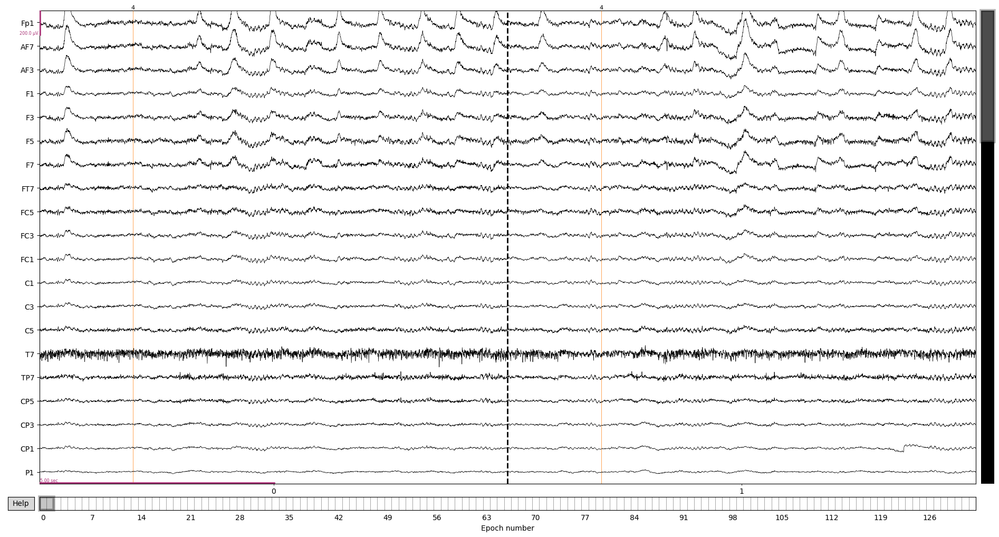

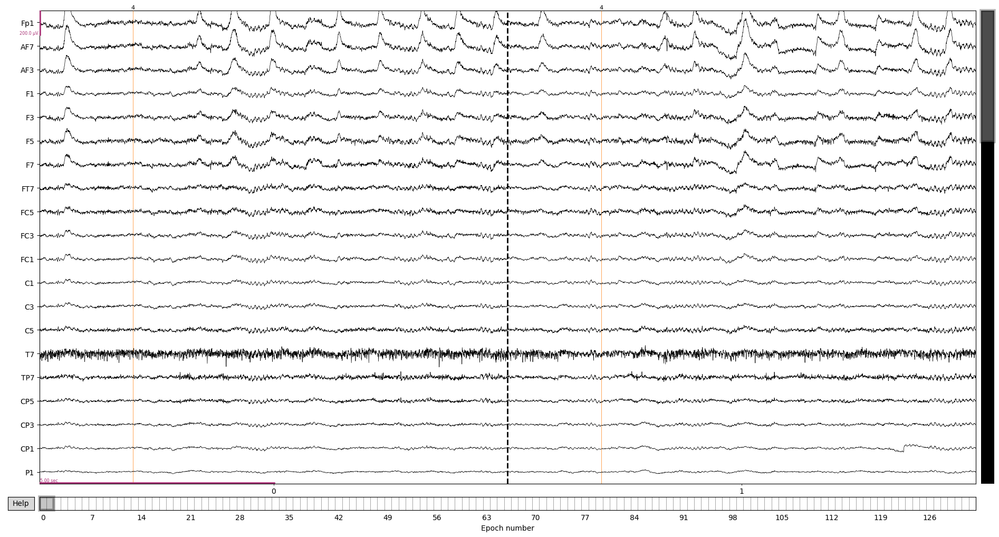

In [8]:
raw.copy().filter(1,120, n_jobs=8).plot(n_channels=20, n_epochs=2, scalings=10e-5, events=raw.events, picks=['eeg','eog'])

Marking bad chanels

In [9]:
raw

Number of events,133
Events,left: 25r_pinch: 27r_stop: 28rest: 27right: 26
Time range,-2.000 – 7.999 sec
Baseline,off


In [9]:
bads =['EXG7','EXG8','T7', 'Iz', 'P2','POz','T8', 'O2', 'P10', 'F6', 'Fp2']
raw.info['bads'] = bads
raw.drop([0, 16, 70, 91, 106, 112])

Dropped 6 epochs: 0, 16, 70, 91, 106, 112


Number of events,127
Events,left: 24r_pinch: 26r_stop: 26rest: 27right: 24
Time range,-2.000 – 7.999 sec
Baseline,off


Referencing

In [10]:
referenced = set_eeg_reference(raw, ref_channels='average')[0]
del raw

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


set channel types

In [11]:
referenced.set_channel_types(get_channel_types())

Number of events,127
Events,left: 24r_pinch: 26r_stop: 26rest: 27right: 24
Time range,-2.000 – 7.999 sec
Baseline,off


Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 1528 tasks      | elapsed:    1.9s
[Parallel(n_jobs=8)]: Done 7288 tasks      | elapsed:    8.1s
[Parallel(n_jobs=8)]: Done 8128 out of 8128 | elapsed:    8.7s finished


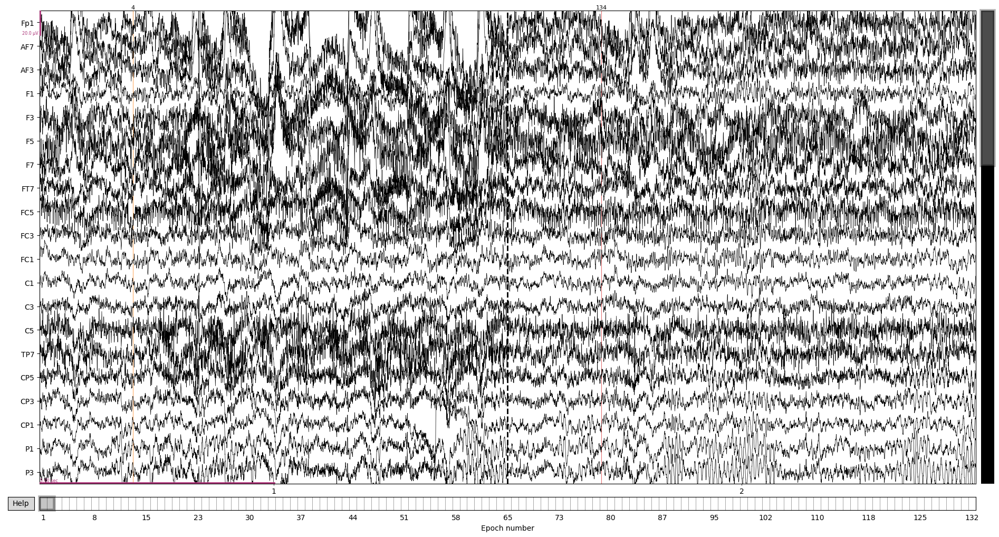

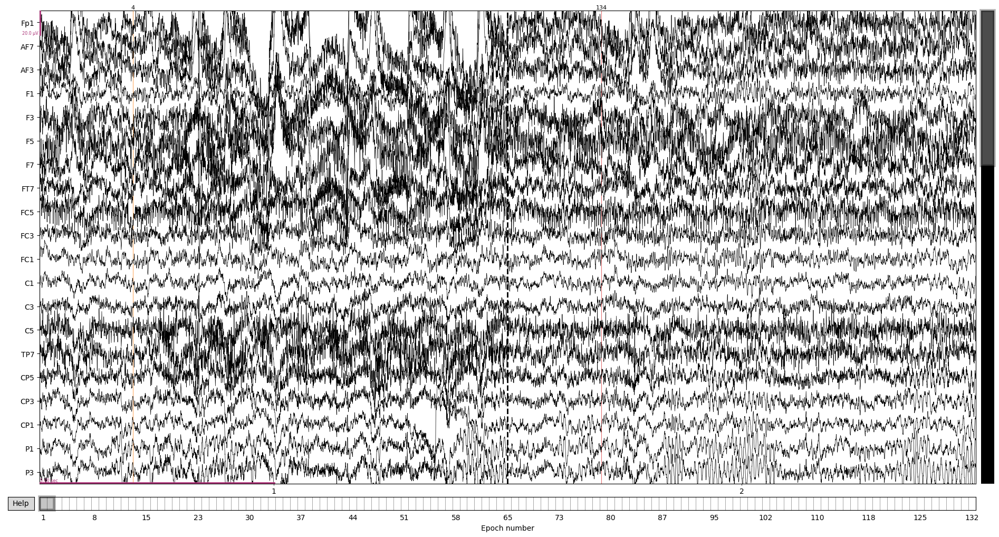

In [13]:
referenced.copy().filter(1,120, n_jobs=8).plot(n_channels=20, n_epochs=2, scalings=10e-6, events=referenced.events, picks=['eeg','eog'])

EOG regression


No projector specified for this dataset. Please consider the method self.add_proj.


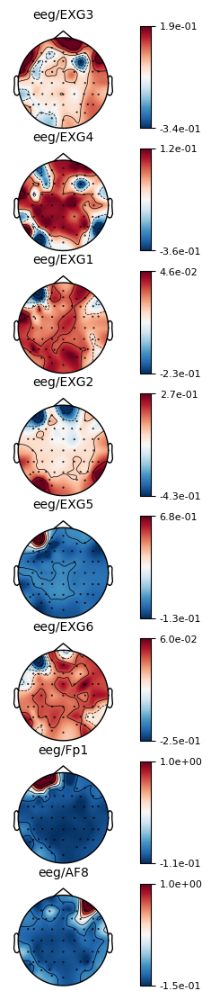

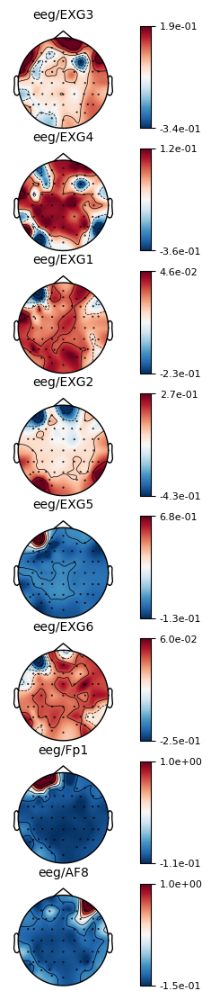

In [12]:
print()
emg_eog = ['EXG3','EXG4','EXG1','EXG2','EXG5','EXG6','Fp1','AF8']
regressor = EOGRegression(
    picks='eeg', picks_artifact= emg_eog).fit(referenced)
regressor.plot()
# referenced = regressor.apply(referenced)
# referenced.info['bads'] += ['Fp1','AF8']

In [13]:
referenced.save('referenced_epo.fif', overwrite=True)
del referenced

Overwriting existing file.


REMOVE ARTIFACTS


In [14]:
epochs = read_epochs('referenced_epo.fif')
epochs

Reading C:\Users\Alberto\Documents\BCI\data\grg\referenced_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
127 matching events found
No baseline correction applied
0 projection items activated


Number of events,127
Events,left: 24r_pinch: 26r_stop: 26rest: 27right: 24
Time range,-2.000 – 7.999 sec
Baseline,off


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


C:\Users\Alberto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


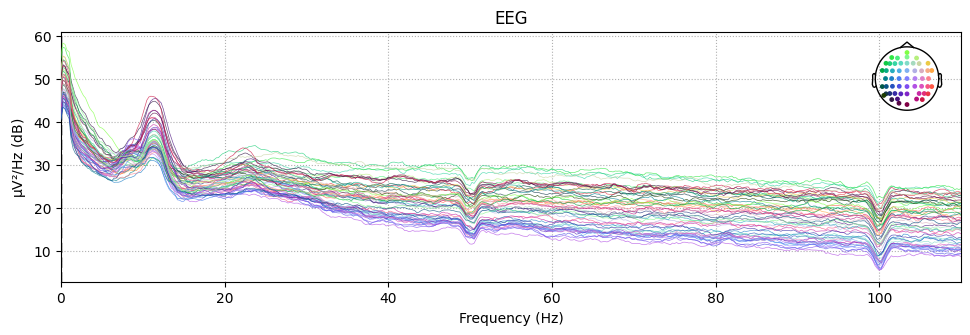

In [17]:
epochs['right'].plot_psd(fmax=110, tmin=0, tmax=4)

EOG Regression

ICA

In [15]:
filtered = epochs.copy().filter(1,250, n_jobs=8)
filtered.apply_baseline((-1.4,-0.1))
filtered.crop(0,5)
ica = ICA(n_components=.9, method='picard')
ica.fit(filtered)

Setting up band-pass filter from 1 - 2.5e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 250.00 Hz
- Upper transition bandwidth: 62.50 Hz (-6 dB cutoff frequency: 281.25 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    8.0s
[Parallel(n_jobs=8)]: Done  96 tasks      | elapsed:   14.2s
[Parallel(n_jobs=8)]: Done 1888 tasks      | elapsed:   18.1s
[Parallel(n_jobs=8)]: Done 5920 tasks      | elapsed:   23.1s
[Parallel(n_jobs=8)]: Done 8100 tasks      | elapsed:   33.0s
[Parallel(n_jobs=8)]: Done 8128 out of 8128 | elapsed:   34.1s finished


Applying baseline correction (mode: mean)
Fitting ICA to data using 55 channels (please be patient, this may take a while)


C:\Users\Alberto\AppData\Local\Temp\ipykernel_7792\3273349700.py:5: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica.fit(filtered)


Selecting by explained variance: 13 components
Fitting ICA took 43.2s.


Method,picard
Fit,44 iterations on epochs (650367 samples)
ICA components,13
Available PCA components,55
Channel types,eeg
ICA components marked for exclusion,—


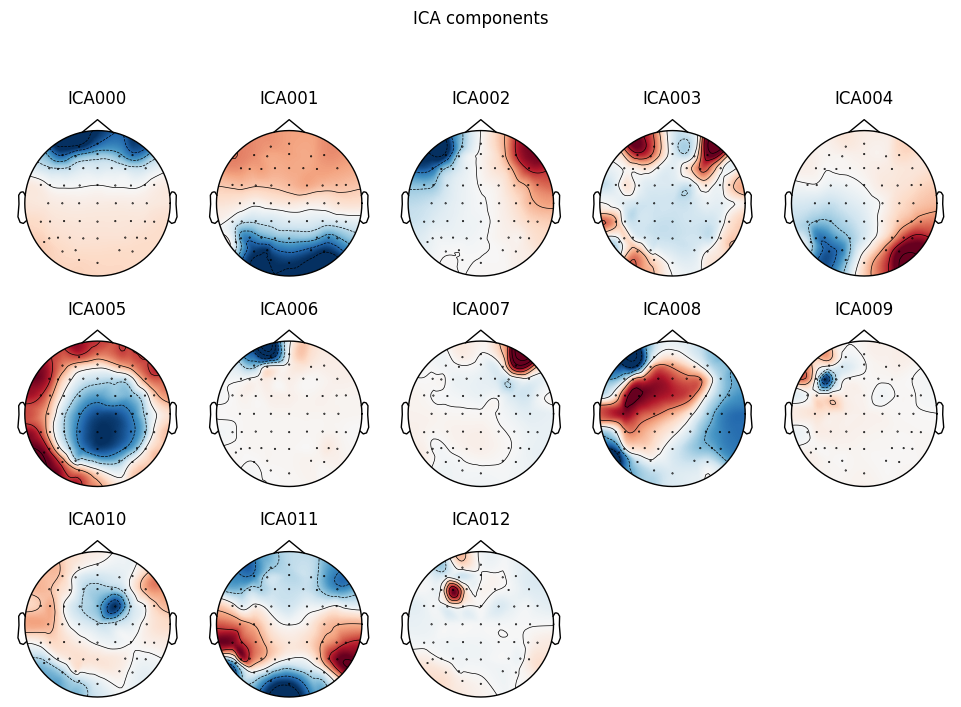

[<MNEFigure size 975x731.5 with 13 Axes>]

In [16]:
print()
plot_ica_components(ica)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


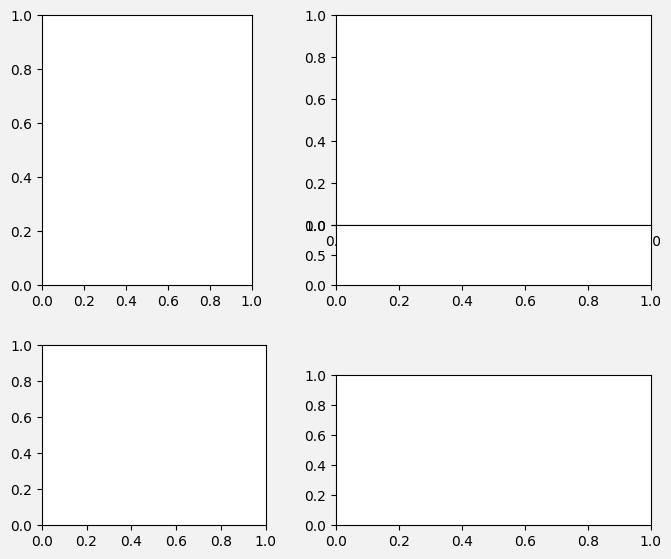

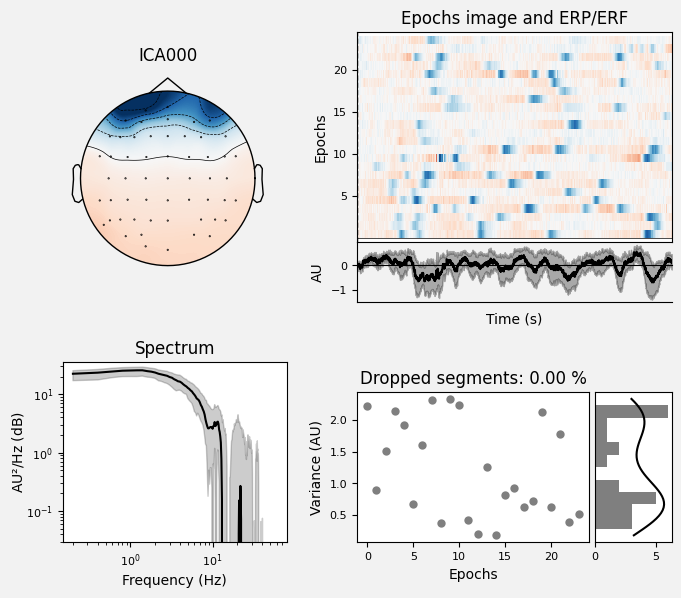

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


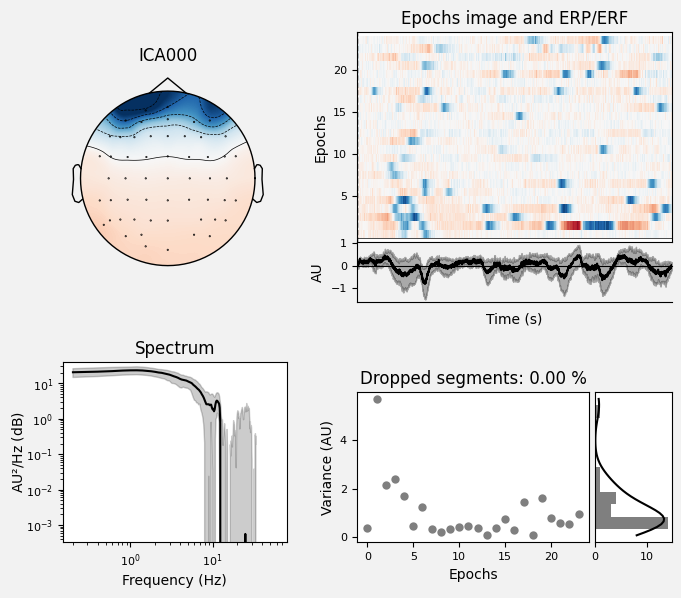

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


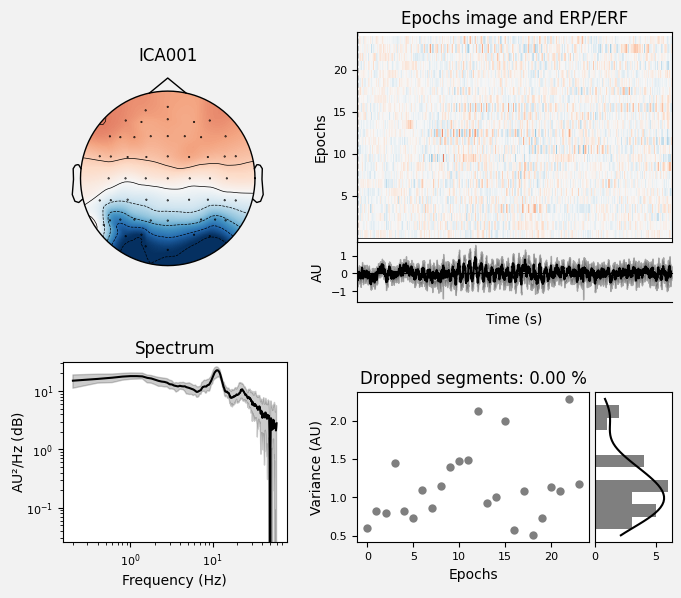

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


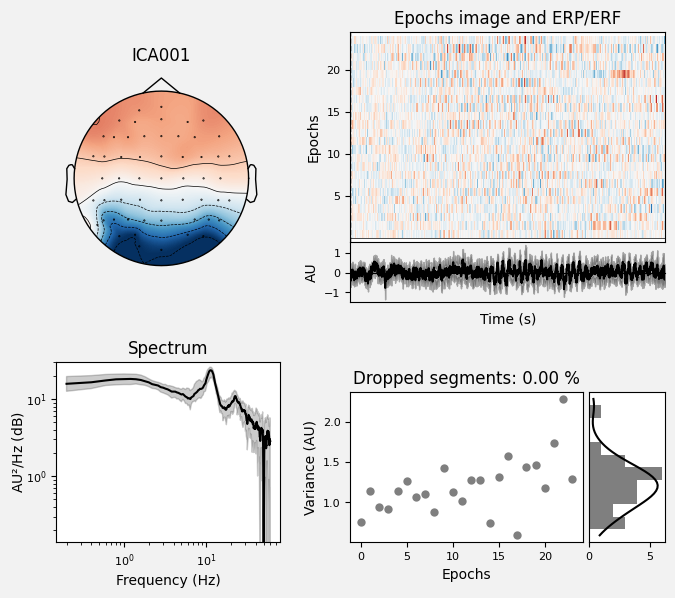

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


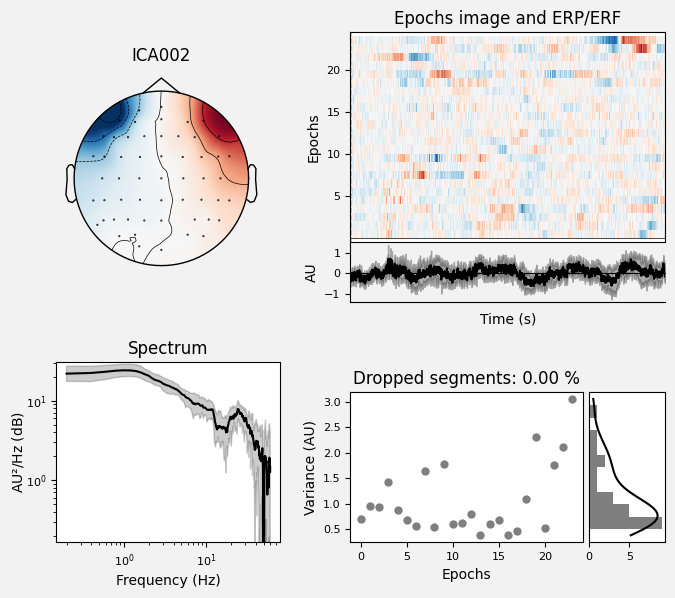

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


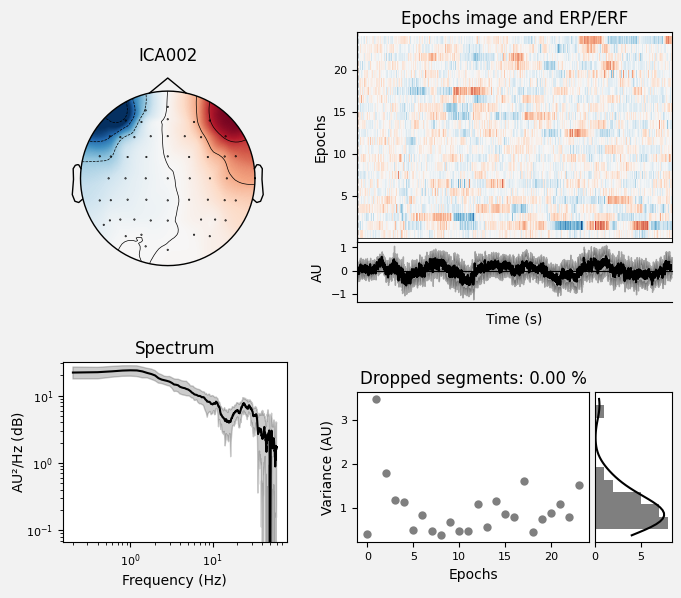

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


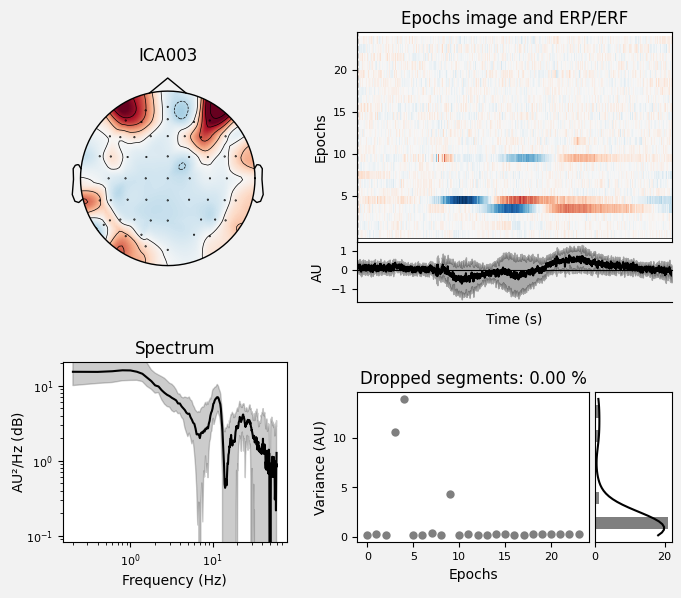

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


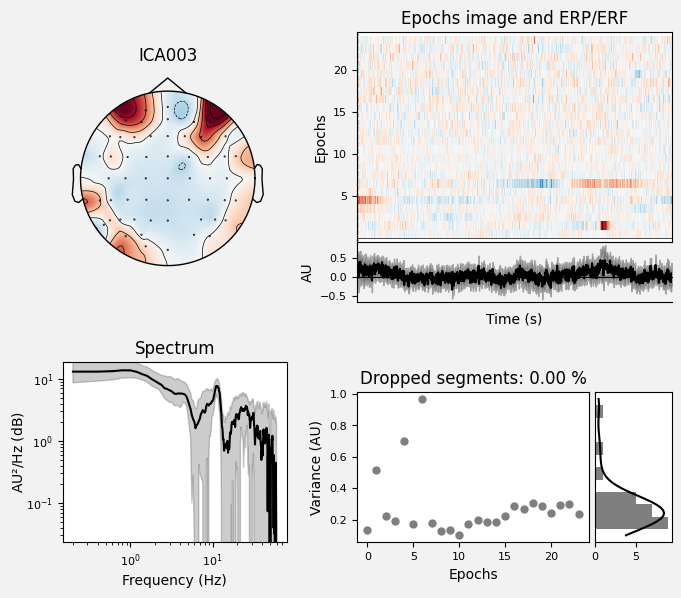

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


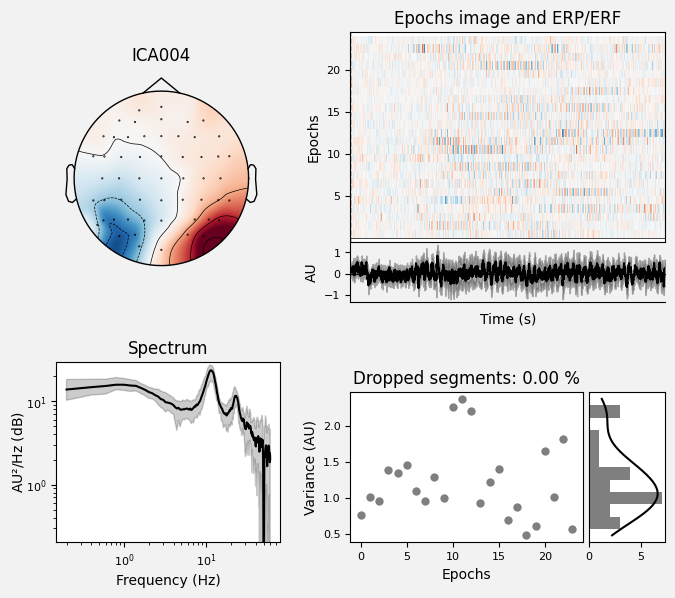

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


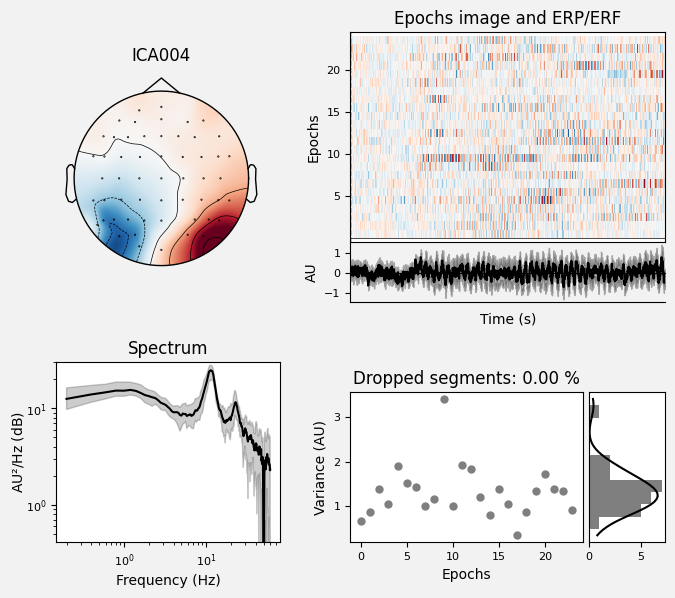

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


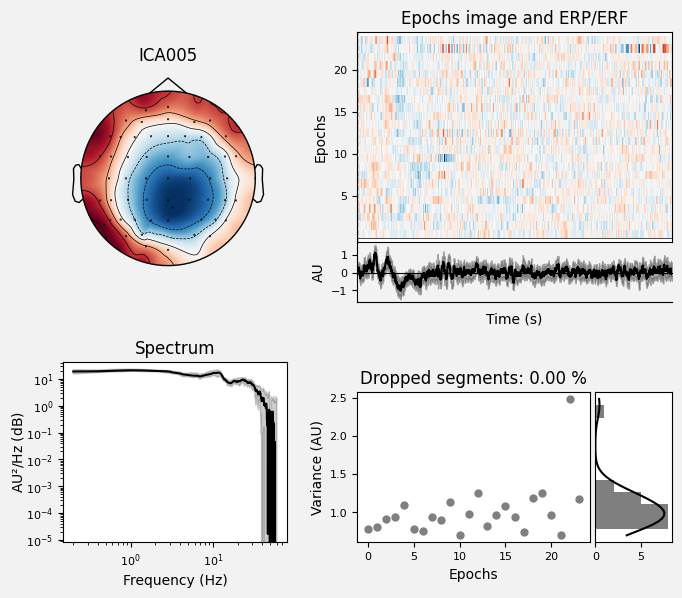

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


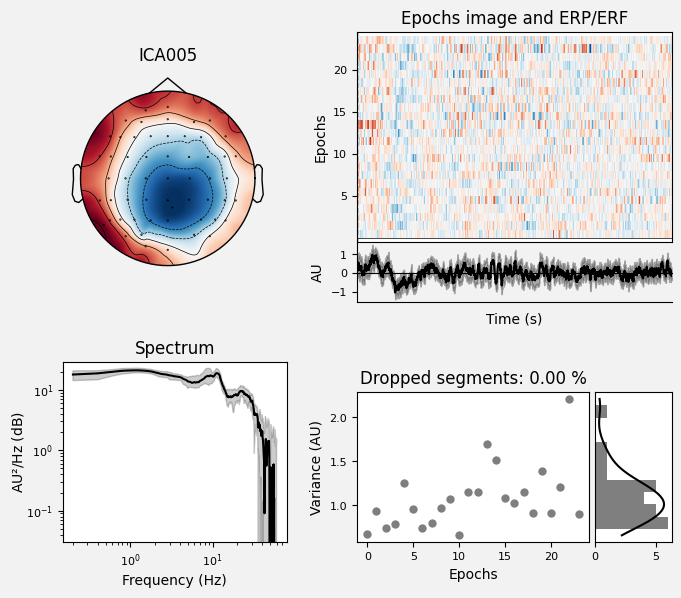

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


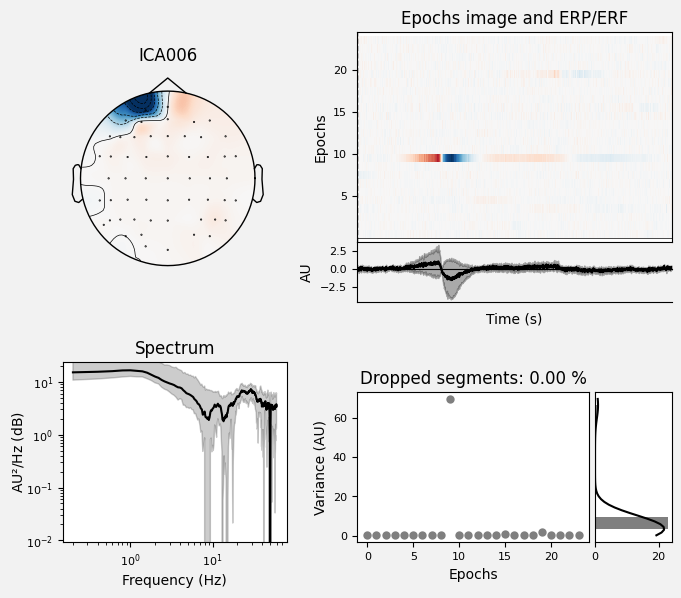

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


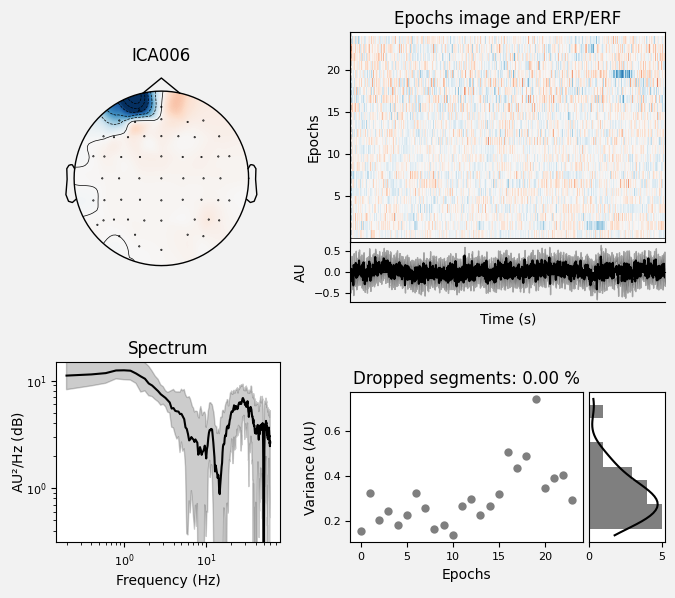

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


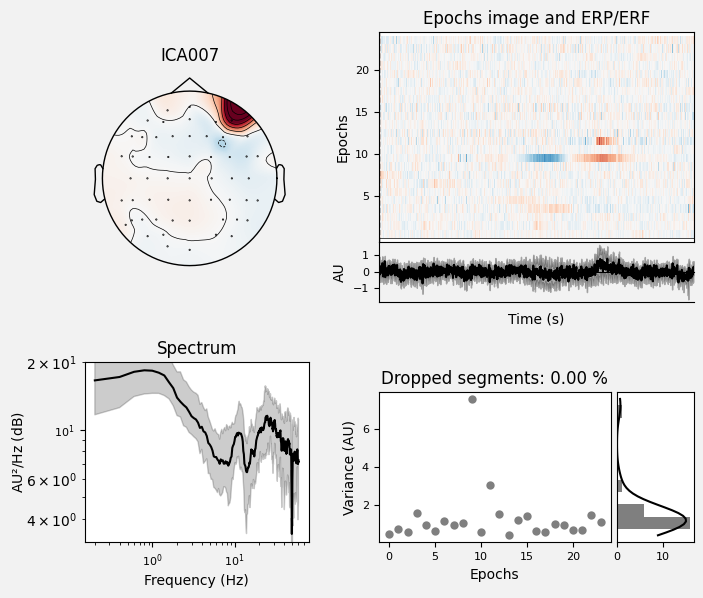

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


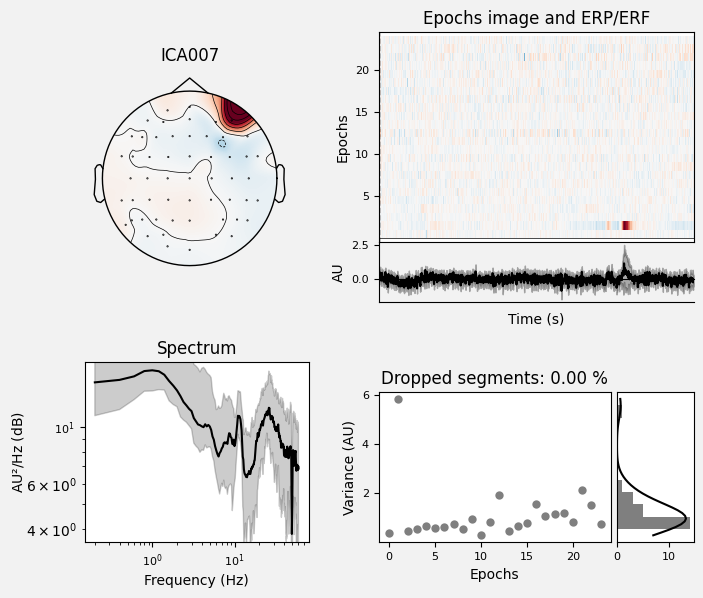

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


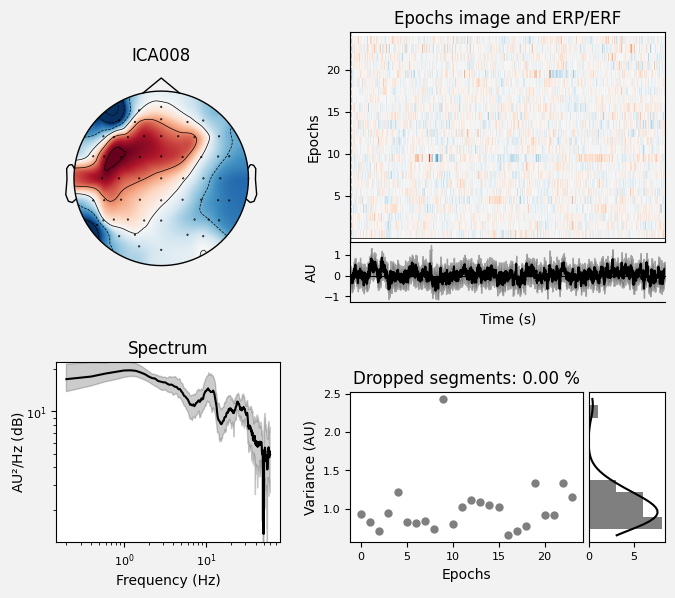

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


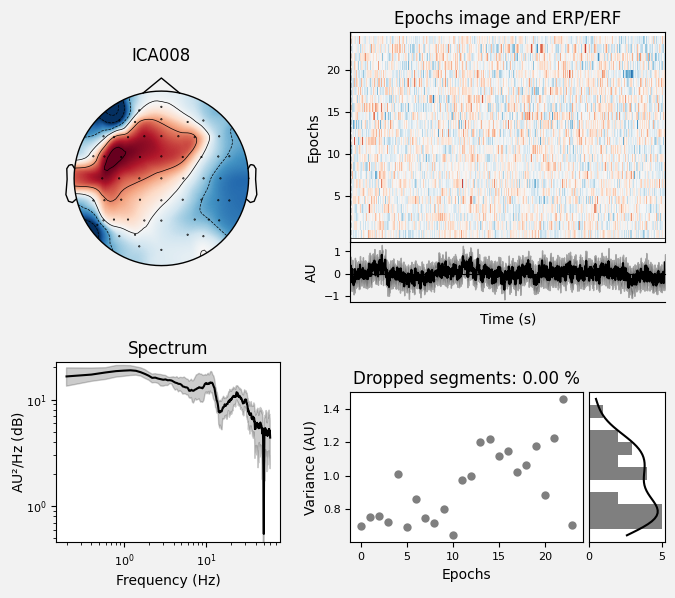

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


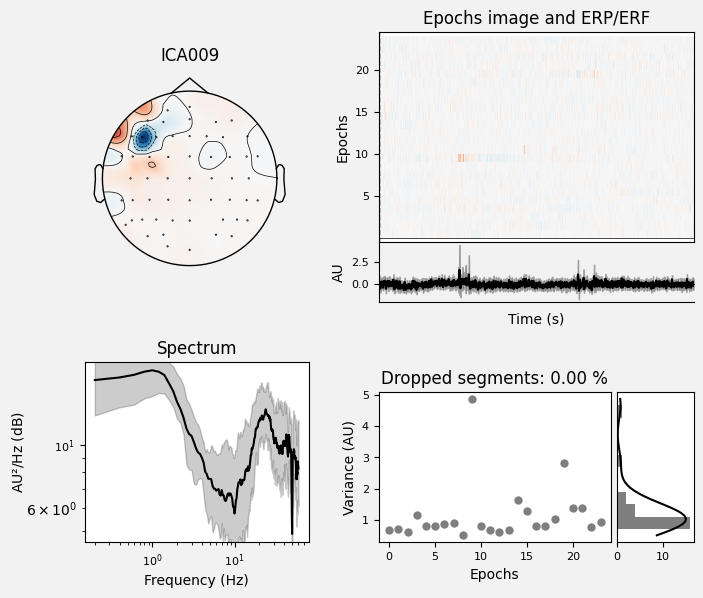

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


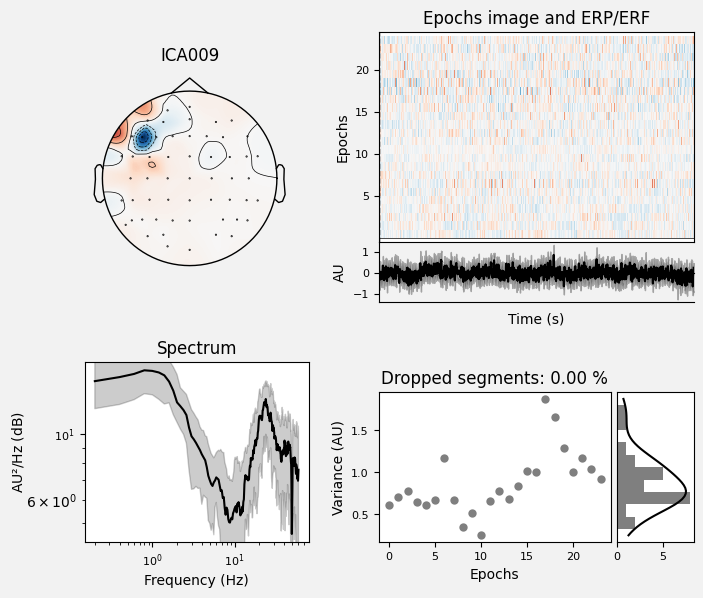

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


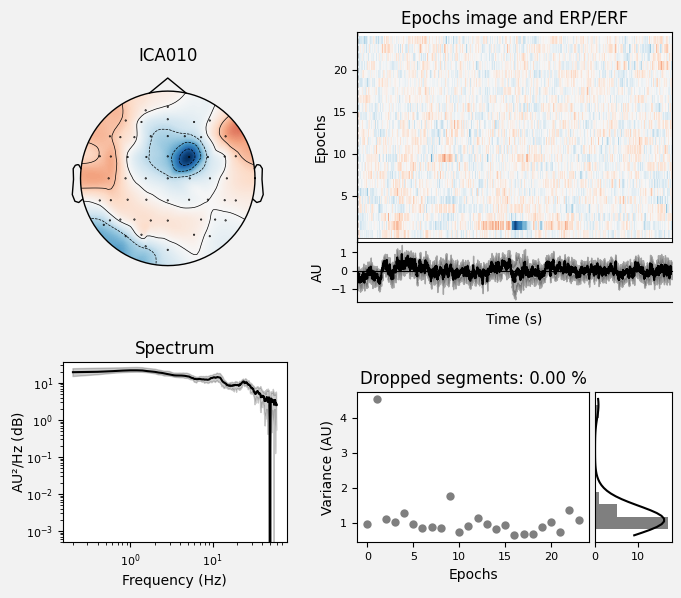

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


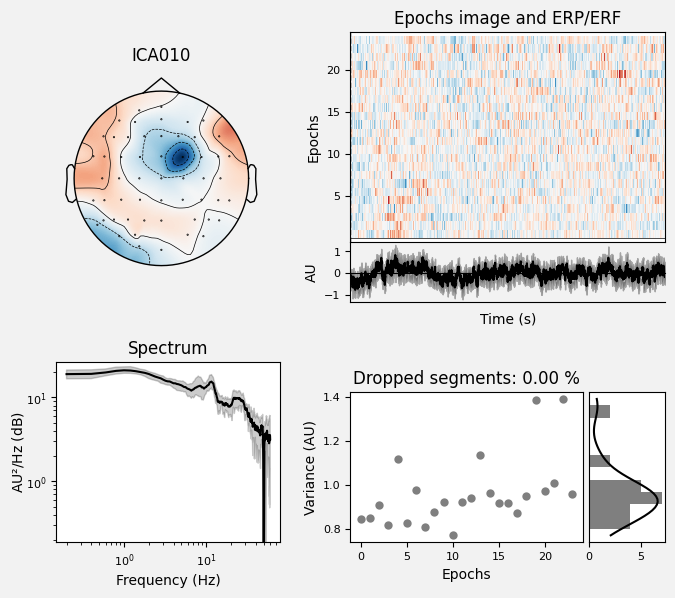

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


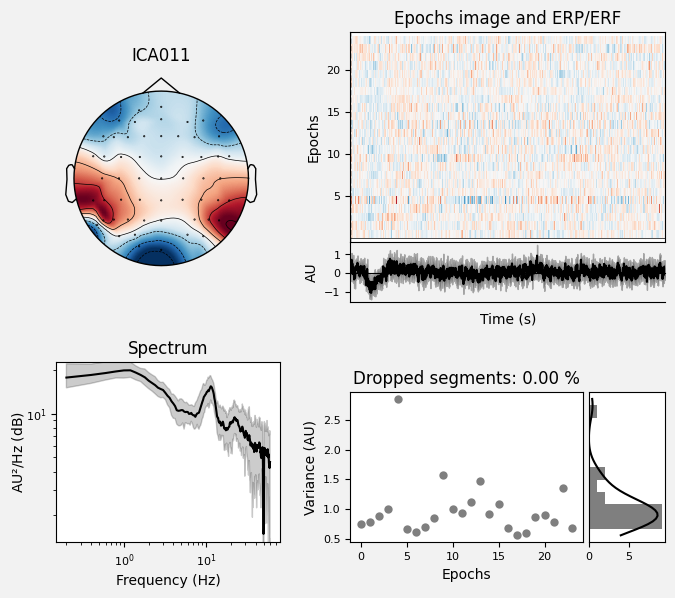

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


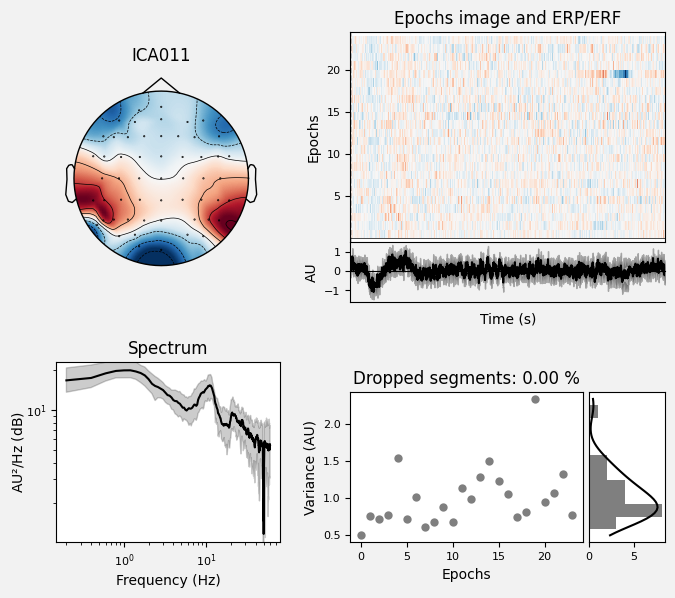

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


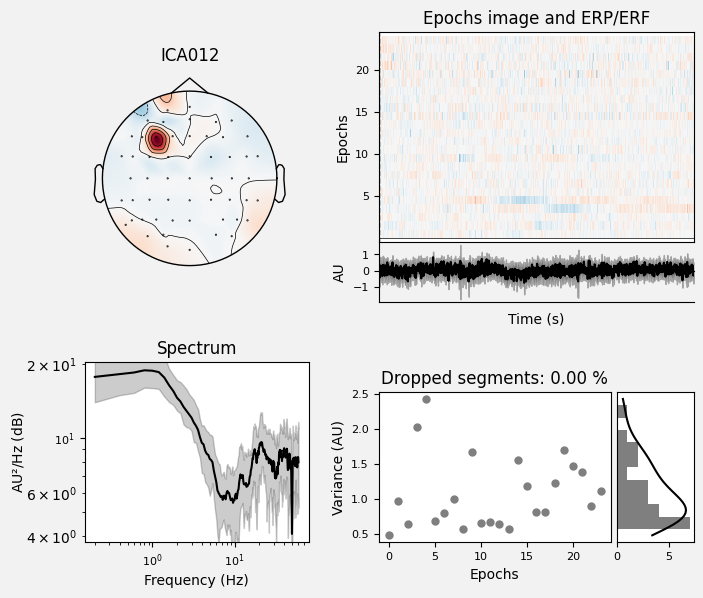

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated


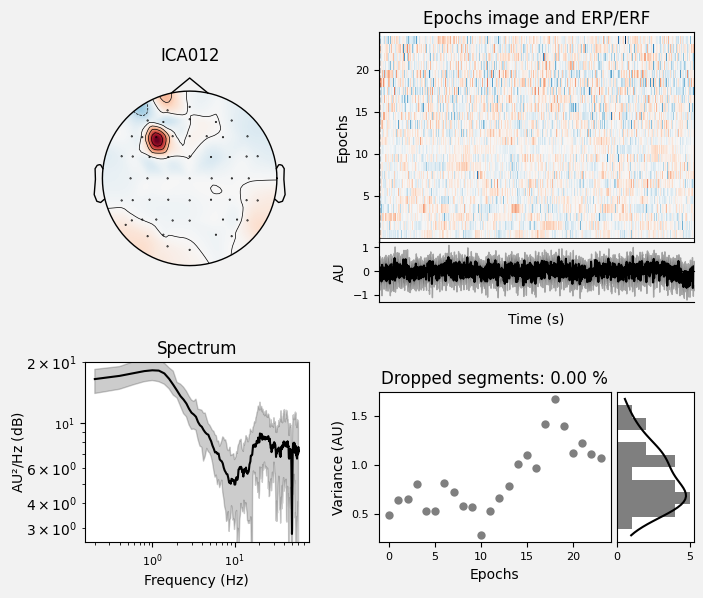

In [20]:
for i in np.arange(13):
    ica.plot_properties(
        epochs['left'].copy().crop(0,5).filter(1,240, verbose=False), 
        picks = [i], 
        log_scale = True,
        psd_args = dict(fmin=.1, fmax=60))

    ica.plot_properties(
        epochs['right'].copy().crop(0,5).filter(1,240, verbose=False), 
        picks = [i], 
        log_scale = True,
        psd_args = dict(fmin=.1, fmax=60))

In [21]:
ica.apply(epochs, exclude=np.unique([0,2,6,9,12]))

Applying ICA to Epochs instance
    Transforming to ICA space (13 components)
    Zeroing out 5 ICA components
    Projecting back using 55 PCA components


Number of events,127
Events,left: 24r_pinch: 26r_stop: 26rest: 27right: 24
Time range,-2.000 – 7.999 sec
Baseline,off


ERP

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



C:\Users\Alberto\AppData\Local\Temp\ipykernel_7792\1473548434.py:1: RuntimeWarning: filter_length (3381) is longer than the signal (1435), distortion is likely. Reduce filter length or filter a longer signal.
  epochs['rest'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1728 out of 1728 | elapsed:    1.2s finished


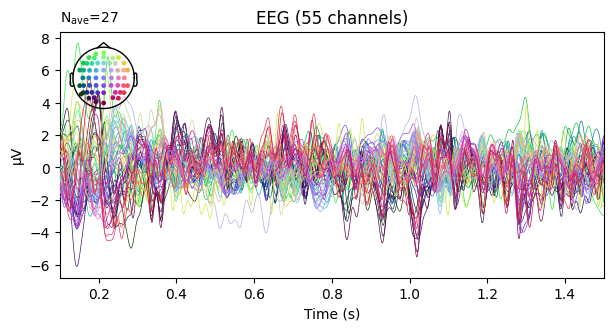

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



C:\Users\Alberto\AppData\Local\Temp\ipykernel_7792\1473548434.py:2: RuntimeWarning: filter_length (3381) is longer than the signal (1435), distortion is likely. Reduce filter length or filter a longer signal.
  epochs['right','left'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 3072 out of 3072 | elapsed:    2.3s finished


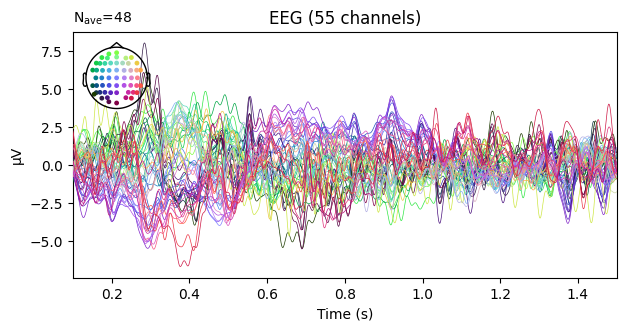

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 3328 out of 3328 | elapsed:    3.0s finished


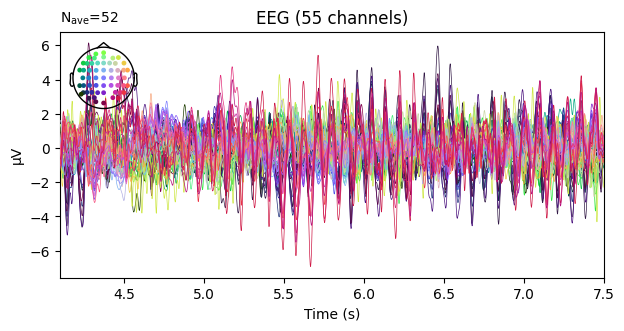

In [22]:
epochs['rest'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
epochs['right','left'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
epochs['r_pinch','r_stop'].copy().apply_baseline((-1.4, -1)).crop(4.1,7.5).filter(1, 40).average().plot()
print()

CSP

In [22]:
le = LabelEncoder()
subset = epochs['left','rest'].copy()
subset.apply_baseline((-1.,-0.1))
subset.drop_channels(epochs.info['bads'])
subset = subset.pick(['eeg'])
y = le.fit_transform(subset.events[:,2])

Applying baseline correction (mode: mean)


In [23]:
pca = UnsupervisedSpatialFilter(PCA(len(subset.info['chs'])), average=False)
csp = CSP(n_components=2, reg=None, log=True, norm_trace=False, rank='info')
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(5, 20, n_jobs=4, verbose=False).get_data(),y)

Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.


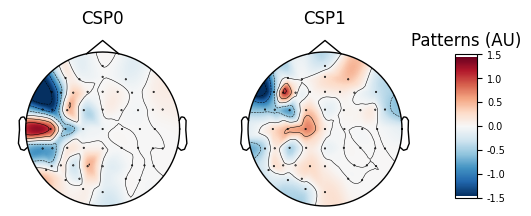

In [24]:
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(5, 20, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.


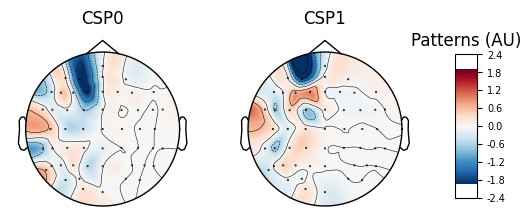

In [25]:
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(20, 35, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 53 after 0 projectors applied to 53 channels
Reducing data rank from 53 -> 53
Estimating covariance using EMPIRICAL
Done.


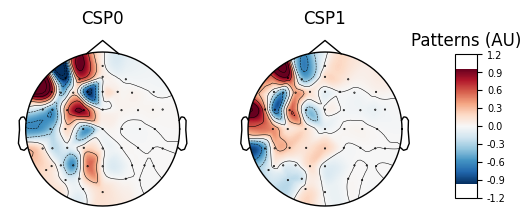

In [26]:
x = pca.fit_transform(subset.copy().crop(-0.1,1.8).filter(70, 90, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

In [23]:
epochs.save('ica_epo.fif', overwrite=True)

Overwriting existing file.


In [26]:
epochs

Number of events,127
Events,left: 24r_pinch: 26r_stop: 26rest: 27right: 24
Time range,-2.000 – 7.999 sec
Baseline,off
